In [1]:
import numpy as np

import matplotlib.pyplot as plt
import networkx as nx

import importlib

import dgsp
import graph_examples as dgsp_graphs
import plotting as dgsp_plot

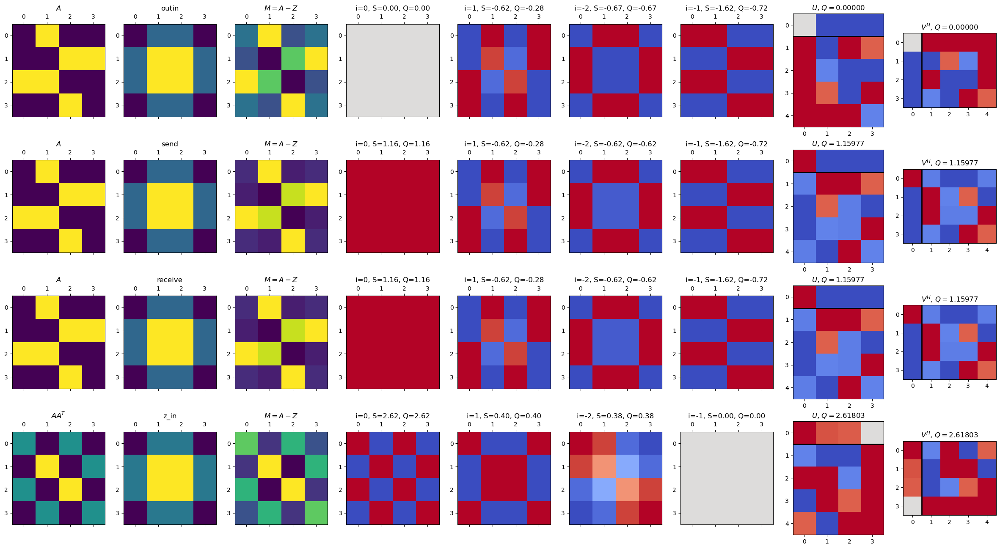

In [3]:
importlib.reload(dgsp)
importlib.reload(dgsp_plot)
adjacency = np.array([[0, 1, 0, 0],
                      [0, 0, 1, 1],
                      [1, 1, 0, 0],
                      [0, 0, 1, 0]])

graph = nx.DiGraph(adjacency)

pos = {0: (0, 1), 1: (1, 1), 2: (0, 0), 3: (1, 0)}
#fig, ax = dgsp_plot.plot_graph(adjacency, position=pos)

#fig, axes = plt.subplots(figsize=(10, 10))
#nx.draw(
#    graph,
#    pos=pos,
#    with_labels=True,
#    ax=axes,
#    arrowsize=20,
#    #node_color=node_color,
#    connectionstyle="arc3,rad=0.1",
#)
#fig.savefig("./figures/two_selector_graph1.png", dpi=300)

all_svds = dgsp_plot.SVD_summary(adjacency, nulls_names=["outin", "send", "receive"], add_undirected="square2",
                          reconstructions_ids=[0, 1, -2, -1])

Text(0, 0.5, '$v_0$')

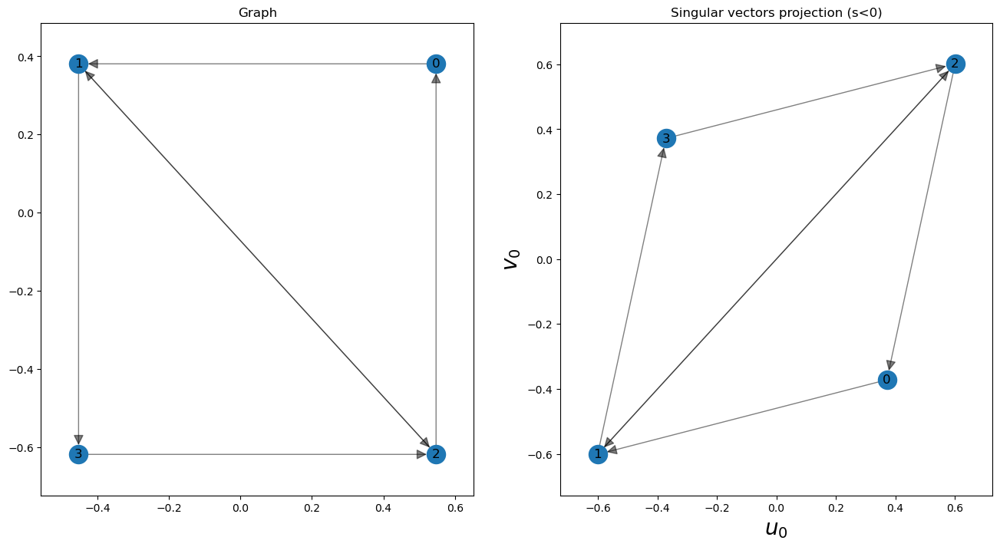

In [4]:
n_nodes = adjacency.shape[0]

U, S, Vh = all_svds[0]
V = Vh.T

vector_id = -1

graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}

fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

dgsp_plot.custom_draw(axes[0], a_mat=adjacency, position="square", edge_alpha=.5)

dgsp_plot.custom_draw(axes[1], a_mat=adjacency, position=graph_pos, nodes=np.arange(n_nodes), edge_alpha=.5)

axes[0].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
axes[0].set_title("Graph")

axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
axes[1].set_title("Singular vectors projection (s<0)")
axes[1].set_xlabel("$u_0$", fontsize=20)
axes[1].set_ylabel("$v_0$", fontsize=20)

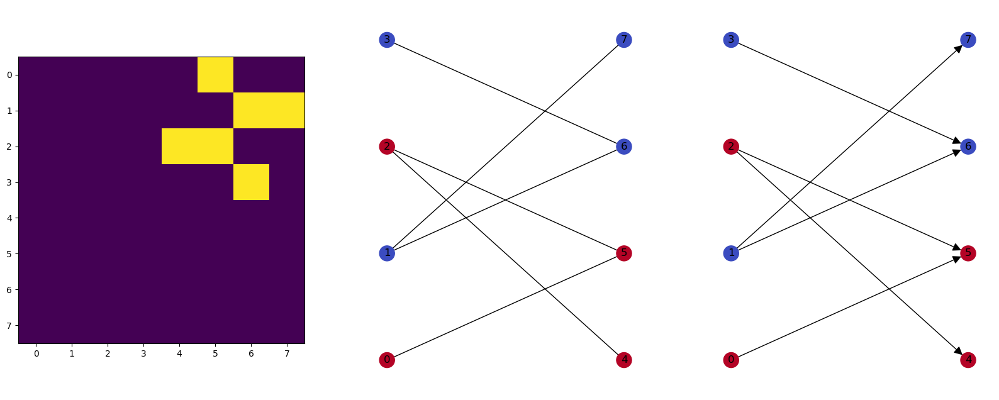

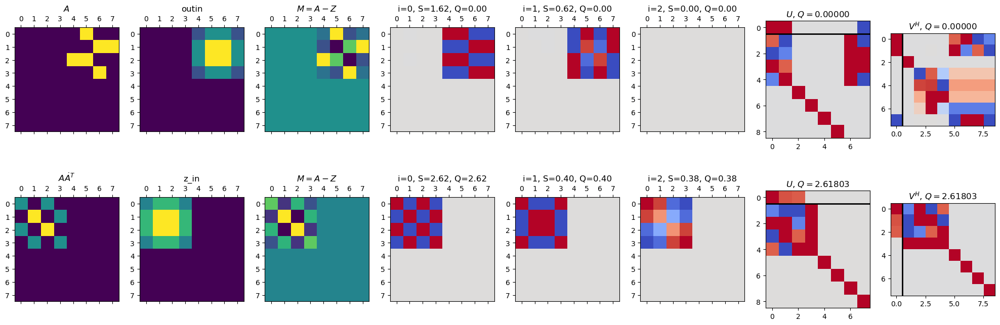

In [5]:
importlib.reload(dgsp_plot)

graph_bip = np.hstack([np.zeros_like(adjacency), adjacency])
graph_bip = np.vstack([graph_bip, np.zeros_like(graph_bip)])

com_vec_bip = np.array([1, -1, 1, -1, 1, 1, -1, -1], dtype=float)

fig, ax = dgsp_plot.plot_graph(graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec_bip, edge_alpha=1)

#fig, axes = plt.subplots(figsize=(10, 10))
#dgsp_plot.custom_draw(axes, a_mat=graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec_bip)
#fig.savefig("./figures/two_selector_bip1.png", dpi=300)


_ = dgsp_plot.SVD_summary(graph_bip, nulls_names=["outin"], add_undirected="square2", reconstructions_ids=[0, 1, 2],
                          vector_subsample=10)

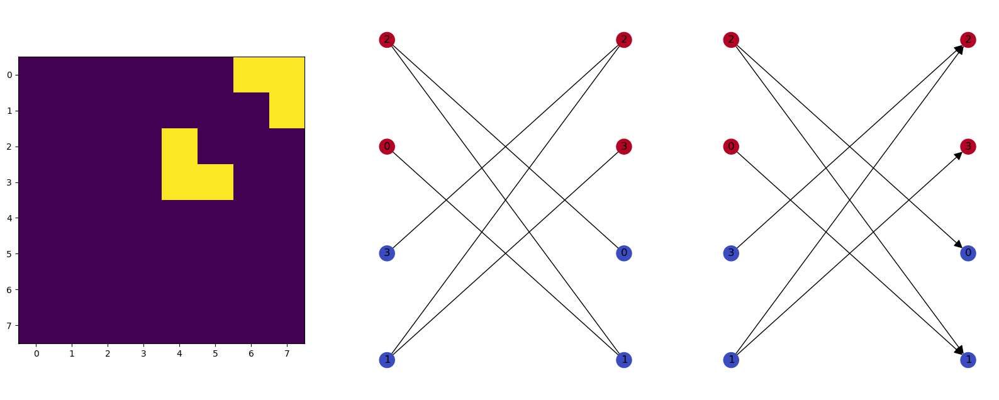

In [6]:
U, S, Vh = all_svds[0]

sort_by_U = np.argsort(U[:, -1])
sort_by_V = np.argsort(Vh[-1])

sorted_graph_bip = graph_bip[np.concatenate([sort_by_U, len(sort_by_U) + sort_by_U])][:, np.concatenate([sort_by_V, len(sort_by_V) + sort_by_V])]

com_vec = np.concatenate([U[sort_by_U, -1], Vh[-1, sort_by_V]])

labels = {i: f"{id}" for i, id in enumerate(sort_by_U)}
labels.update({len(sort_by_V)+i: f"{id}" for i, id in enumerate(sort_by_V)})

fig, ax = dgsp_plot.plot_graph(sorted_graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec, edge_alpha=1, labels=labels)

# Looking at extended 4-pattern bi-modularity
Fully connected example with 3 nodes per communities (4 communities).

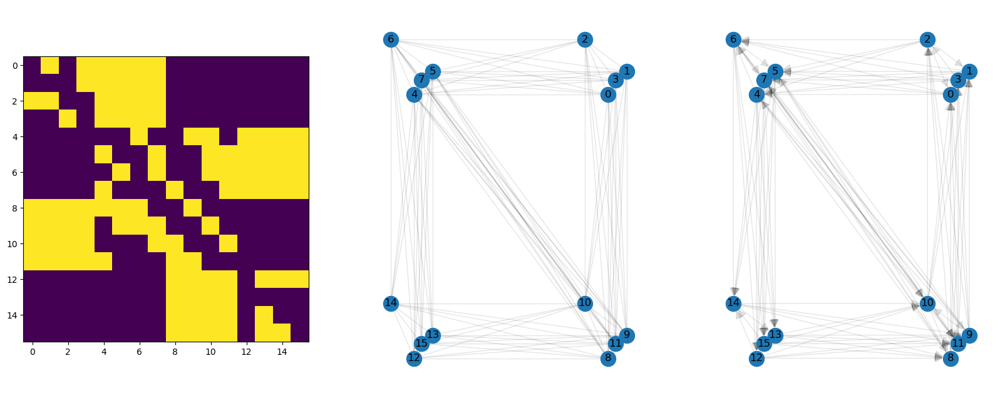

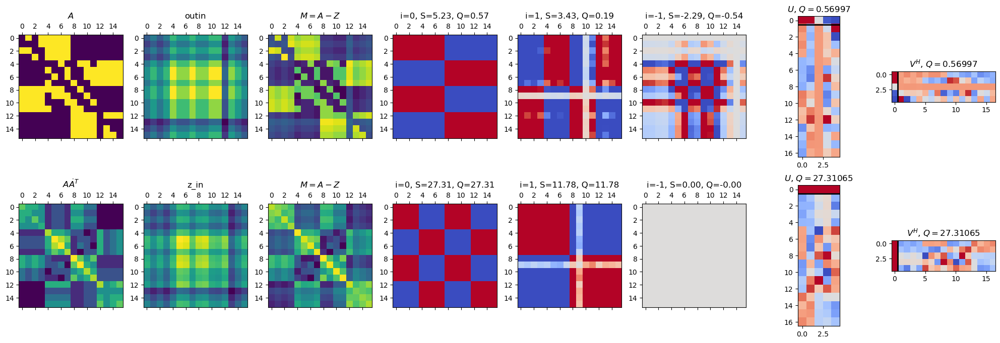

In [7]:
importlib.reload(dgsp_graphs)
importlib.reload(dgsp_plot)

density_value = 1

graph = dgsp_graphs.toy_n_communities(4, 4, com_density=1,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, .5, 1, 0], seed=1234)

#fig, ax = dgsp_plot.plot_graph(graph, position="spring")
fig, ax = dgsp_plot.plot_graph(graph, position="square")
all_svds = dgsp_plot.SVD_summary(graph, nulls_names=["outin"], add_undirected="square2", reconstructions_ids=[0, 1, -1])

Text(0, 0.5, '$v_0$')

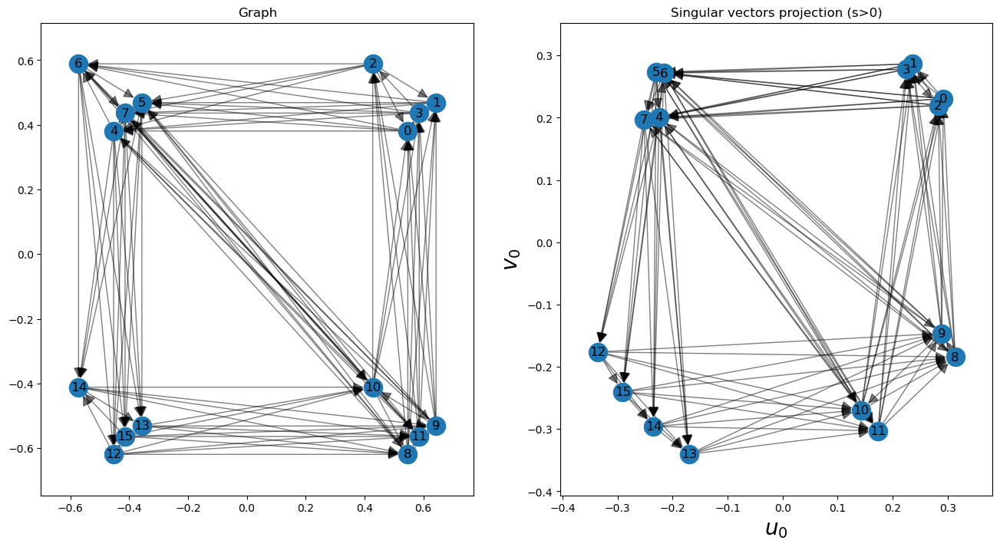

In [8]:
n_nodes = graph.shape[0]

U, S, Vh = all_svds[0]
V = Vh.T

vector_id = 0

graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}

fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

dgsp_plot.custom_draw(axes[0], a_mat=graph, position="square", edge_alpha=.5)

dgsp_plot.custom_draw(axes[1], a_mat=graph, position=graph_pos, nodes=np.arange(n_nodes), edge_alpha=.5)

axes[0].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
axes[0].set_title("Graph")

axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
axes[1].set_title("Singular vectors projection (s>0)")
axes[1].set_xlabel("$u_0$", fontsize=20)
axes[1].set_ylabel("$v_0$", fontsize=20)

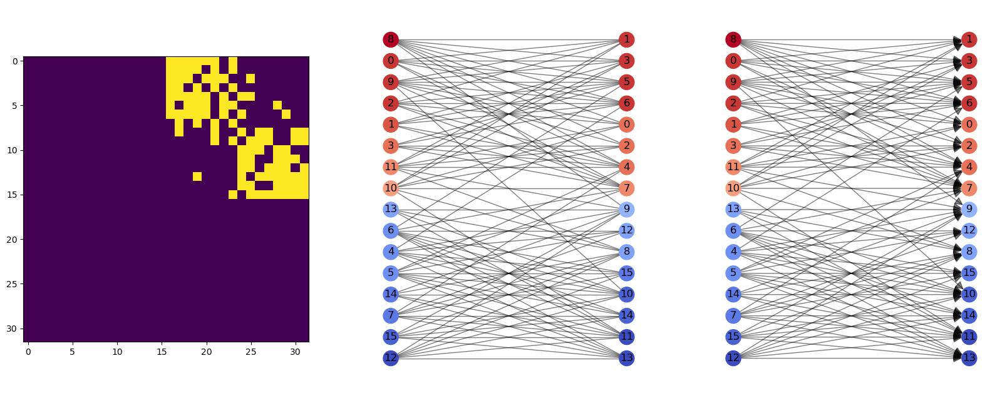

In [9]:
importlib.reload(dgsp_plot)

graph_bip = np.hstack([np.zeros_like(graph), graph])
graph_bip = np.vstack([graph_bip, np.zeros_like(graph_bip)])

U, S, Vh = all_svds[0]

sort_by_U = np.argsort(U[:, vector_id])
sort_by_V = np.argsort(Vh[vector_id])

sorted_graph_bip = graph_bip[np.concatenate([sort_by_U, len(sort_by_U) + sort_by_U])][:, np.concatenate([sort_by_V, len(sort_by_V) + sort_by_V])]

com_vec = np.concatenate([U[sort_by_U, vector_id], Vh[vector_id, sort_by_V]])

labels = {i: f"{id}" for i, id in enumerate(sort_by_U)}
labels.update({len(sort_by_V)+i: f"{id}" for i, id in enumerate(sort_by_V)})

fig, ax = dgsp_plot.plot_graph(sorted_graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec, edge_alpha=.5, labels=labels)

## Decreasing the connection density and increasing the statistical number

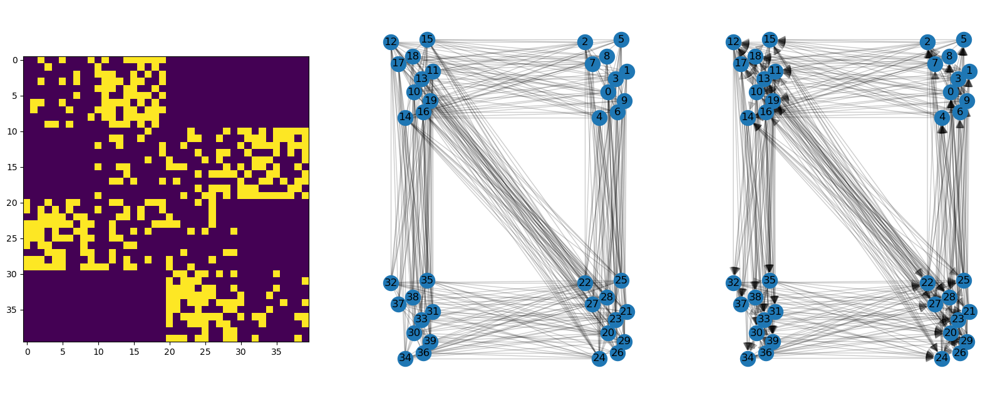

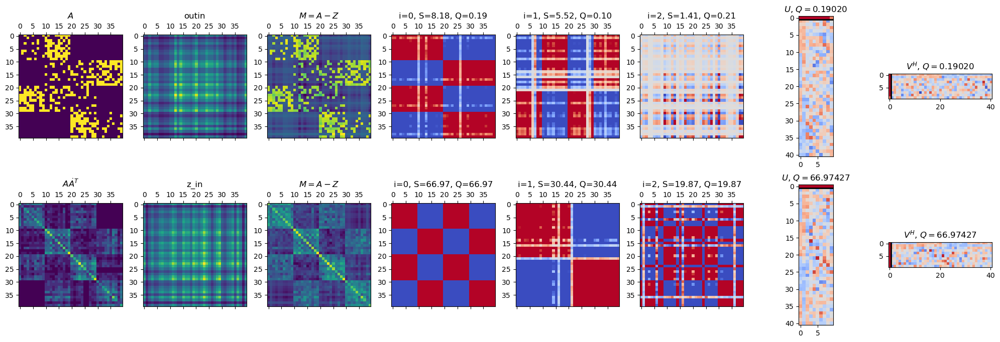

In [10]:
importlib.reload(dgsp_graphs)
importlib.reload(dgsp_plot)

density_value = 0.6

graph = dgsp_graphs.toy_n_communities(10, 4, com_density=0.4,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, .5, 1, 0], seed=1234)

#fig, ax = dgsp_plot.plot_graph(graph, position="spring")
fig, ax = dgsp_plot.plot_graph(graph, position="square", edge_alpha=0.2)
all_svds = dgsp_plot.SVD_summary(graph, nulls_names=["outin"], add_undirected="square2", reconstructions_ids=[0, 1, 2],
                                 vector_subsample=10)

Text(0, 0.5, '$v_0$')

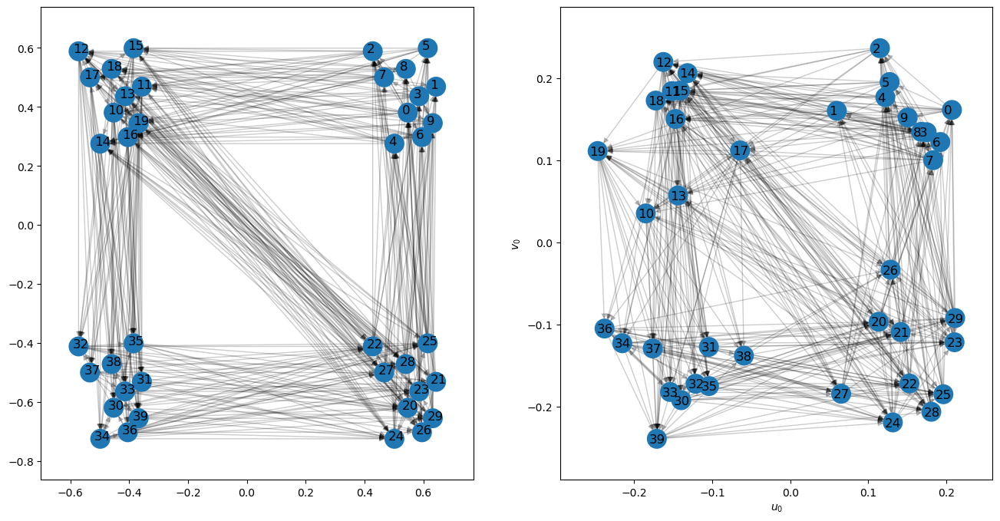

In [11]:
U, S, Vh = all_svds[0]
V = Vh.T

fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

G = nx.DiGraph(graph)

pos = dgsp_plot.square_community_pos(len(graph) // 4, 4)
pos_array = np.array(list(pos.values()))

nx.draw_networkx_edges(G, pos=pos, alpha=.2, ax=axes[0])
axes[0].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

axes[0].scatter(pos_array[:, 0], pos_array[:, 1], s=350, alpha=1, edgecolors="none")
for i, _ in enumerate(graph):
    axes[0].text(pos_array[i, 0].real-0.02, pos_array[i, 1].real-0.005, i, fontsize=12)

graph_pos = {i: (U[i, 0].real, V[i, 0].real) for i in range(graph.shape[0])}
nx.draw_networkx_edges(G, pos=graph_pos, alpha=.2, ax=axes[1])
axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

axes[1].scatter(U[:, 0], V[:, 0], s=350, alpha=1, edgecolors="none")

for i, _ in enumerate(graph):
    axes[1].text(U[i, 0].real-0.01, V[i, 0].real-0.005, i, fontsize=12)

axes[1].set_xlabel("$u_0$")
axes[1].set_ylabel("$v_0$")

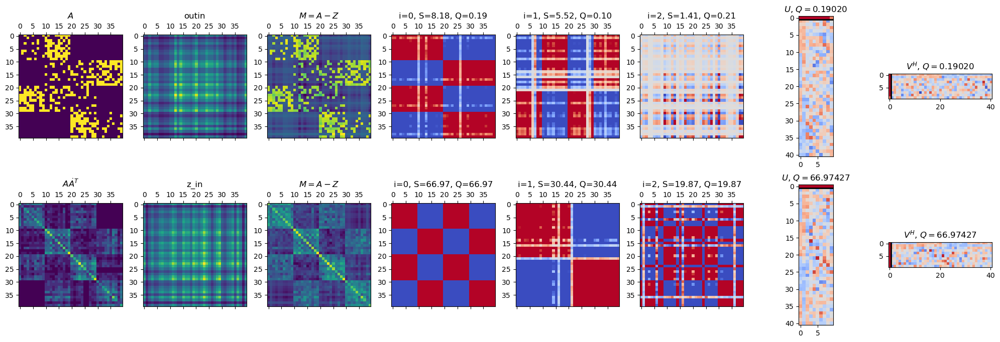

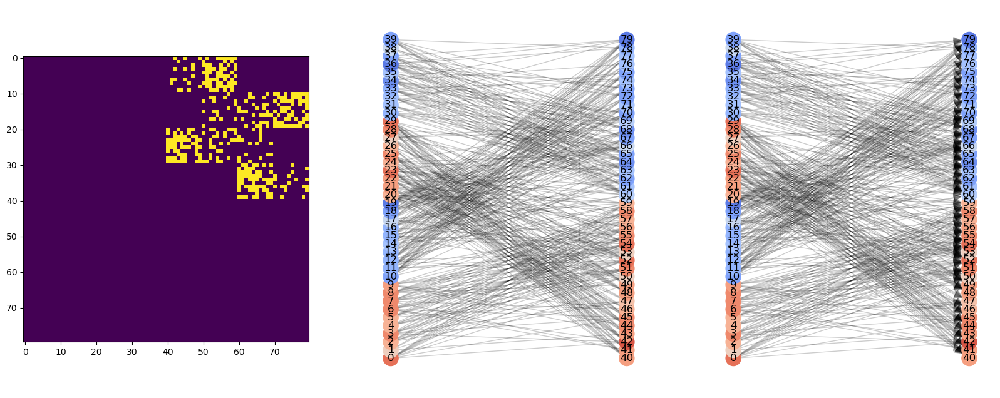

In [12]:
graph_bip = np.hstack([np.zeros_like(graph), graph])
graph_bip = np.vstack([graph_bip, np.zeros_like(graph_bip)])

all_svds = dgsp_plot.SVD_summary(graph, nulls_names=["outin"], add_undirected="square2", reconstructions_ids=[0, 1, 2],
                                 vector_subsample=10)

U = all_svds[0][0]
Vh = all_svds[0][2]

com_vec_svd = np.hstack([U[:, 0], Vh[0]])
fig, ax = dgsp_plot.plot_graph(graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec_svd, edge_alpha=0.2)

#fig, axes = plt.subplots(figsize=(10, 10))
#dgsp_plot.custom_draw(axes, a_mat=graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec_svd)
#fig.savefig("./figures/two_selector_bip10.png", dpi=300)

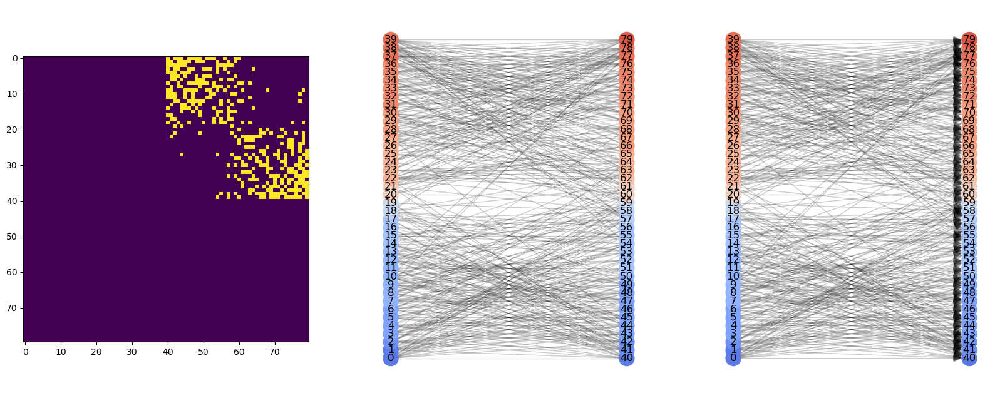

In [13]:
sort_by_U = np.argsort(U[:, 0])
sort_by_V = np.argsort(Vh[0])

sorted_graph_bip = graph_bip[np.concatenate([sort_by_U, len(sort_by_U) + sort_by_U])][:, np.concatenate([sort_by_V, len(sort_by_V) + sort_by_V])]

com_vec = np.concatenate([U[sort_by_U, 0], Vh[0, sort_by_V]])

no_labels = {i: "" for i in range(graph_bip.shape[0])}
fig, ax = dgsp_plot.plot_graph(sorted_graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec, edge_alpha=0.2)

## Adding even more nodes

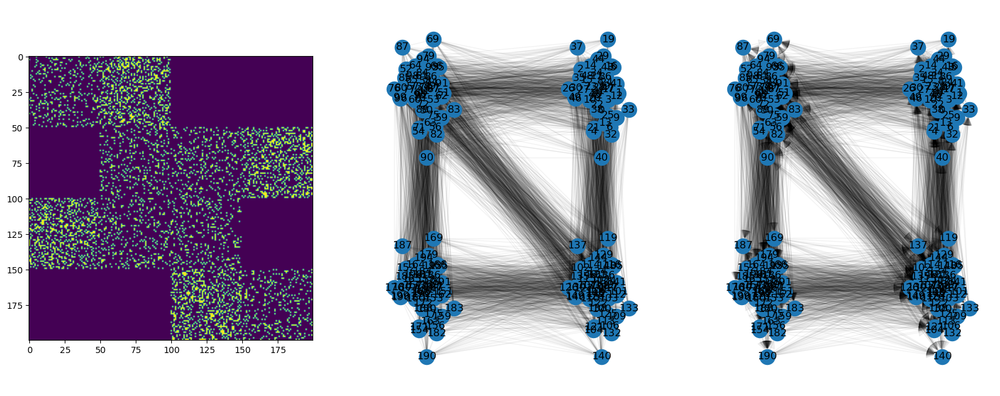

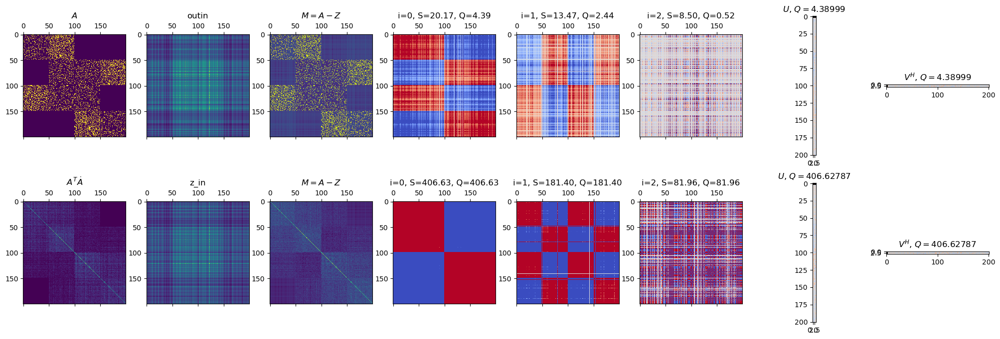

In [14]:
importlib.reload(dgsp_graphs)
importlib.reload(dgsp_plot)

density_value = 0.3

graph = dgsp_graphs.toy_n_communities(50, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, .5, 1, 0], seed=1234)

#fig, ax = dgsp_plot.plot_graph(graph, position="spring")
fig, ax = dgsp_plot.plot_graph(graph, position="square", edge_alpha=0.05)
#fig, ax = dgsp_plot.plot_graph(graph, position="square", edge_alpha=0.05)
all_svds = dgsp_plot.SVD_summary(graph, nulls_names=["outin"], add_undirected="square", reconstructions_ids=[0, 1, 2])

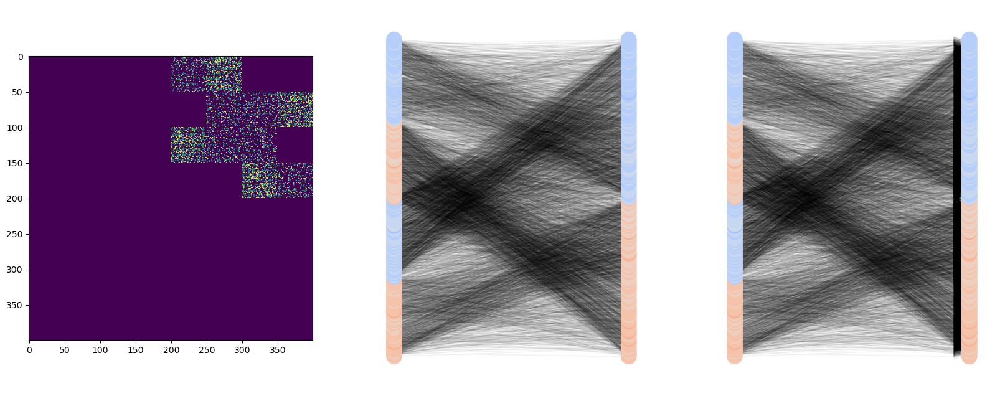

In [15]:
graph_bip = np.hstack([np.zeros_like(graph), graph])
graph_bip = np.vstack([graph_bip, np.zeros_like(graph_bip)])

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph, null_model="outin"))

com_vec_svd = np.hstack([U[:, 0], Vh[0]])

no_labels = {i: "" for i in range(graph_bip.shape[0])}
fig, ax = dgsp_plot.plot_graph(graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec_svd, labels=no_labels, edge_alpha=0.05)

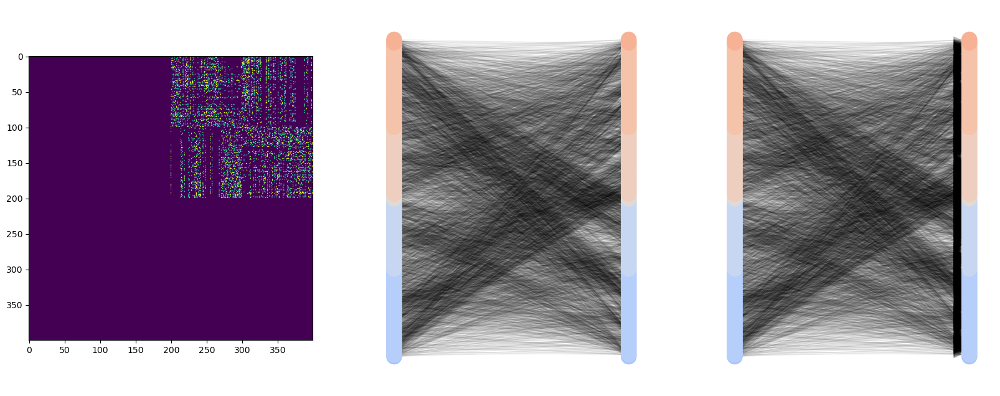

In [16]:
sort_by_U = np.argsort(U[:, 0])
sort_by_V = np.argsort(Vh[0])

#sorted_graph_bip = graph_bip[np.concatenate([sort_by_U, len(sort_by_U) + sort_by_U])][:, np.concatenate([sort_by_V, len(sort_by_V) + sort_by_V])]
sorted_graph_bip = graph_bip[np.concatenate([sort_by_U, len(sort_by_U) + sort_by_U])][:, np.concatenate([sort_by_U, len(sort_by_U) + sort_by_U])]

#com_vec = np.concatenate([U[sort_by_U, 0], Vh[0, sort_by_V]])
com_vec = np.concatenate([U[sort_by_U, 0]]*2)

no_labels = {i: "" for i in range(graph_bip.shape[0])}
fig, ax = dgsp_plot.plot_graph(sorted_graph_bip, position="bipartite", nodes=np.arange(graph_bip.shape[0]//2), community_vector=com_vec, edge_alpha=0.05, labels=no_labels)

## Adding sources and sinks

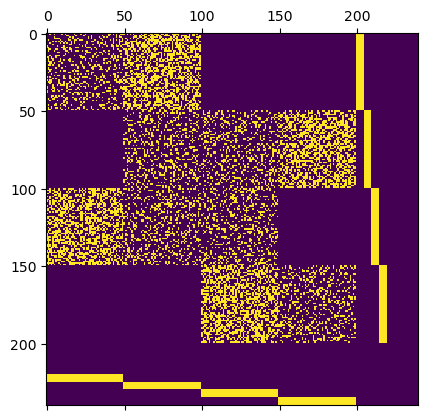

In [60]:
density_value = 0.5

graph = dgsp_graphs.toy_n_communities(50, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, .5, 1, 0], seed=1234)

n_nodes = graph.shape[0]
n_per_com = n_nodes//4
graph_added = graph.copy()

n_added = 5
added_cols = np.zeros((graph_added.shape[0], 4*n_added))

for i in range(4):
    added_cols[50*i:50*(i+1), i*n_added:n_added*(i+1)] = 1

sparse_thresh = .01

sparse_threshes = np.linspace(-.2, -.1, n_added)
sparse_threshes = [-5]*n_added

for source_id in range(4):
    for col_i, t in enumerate(sparse_threshes):
        random_sparse = np.random.normal(np.zeros(added_cols.shape[0]), 0.1)
        added_cols[random_sparse < t, n_added*source_id+col_i] = 0

graph_added = np.hstack([graph_added, added_cols])

added_rows = np.zeros((4*n_added, graph_added.shape[1]))
graph_added = np.vstack([graph_added, np.zeros((4*n_added, graph_added.shape[1]))])

for i in range(4):
    added_rows[i*n_added:n_added*(i+1), 50*i:50*(i+1)] = 1

for sink_id in range(4):
    for row_i, t in enumerate(sparse_threshes):
        random_sparse = np.random.normal(np.zeros(added_rows.shape[1]), 0.1)
        added_rows[n_added*sink_id+row_i, random_sparse < t] = 0

graph_added = np.vstack([graph_added, added_rows])
graph_added = np.hstack([graph_added, np.zeros((graph_added.shape[0], 4*n_added))])

graph_added += (np.random.normal(0, 1, graph_added.shape) > 100).astype(int)

graph_added = np.clip(graph_added, a_min=0, a_max=1)

# Use cmap tab20c
colors = np.zeros(graph_added.shape[0], dtype=int)

for i in range(4):
    colors[n_per_com*i:n_per_com*(i+1)] = i*4
    colors[n_nodes+n_added*i:n_nodes+n_added*(i+1)] = i*4+1
    colors[n_nodes+n_added*4+n_added*i:n_nodes+n_added*4+n_added*(i+1)] = i*4+3

plt.matshow(graph_added)

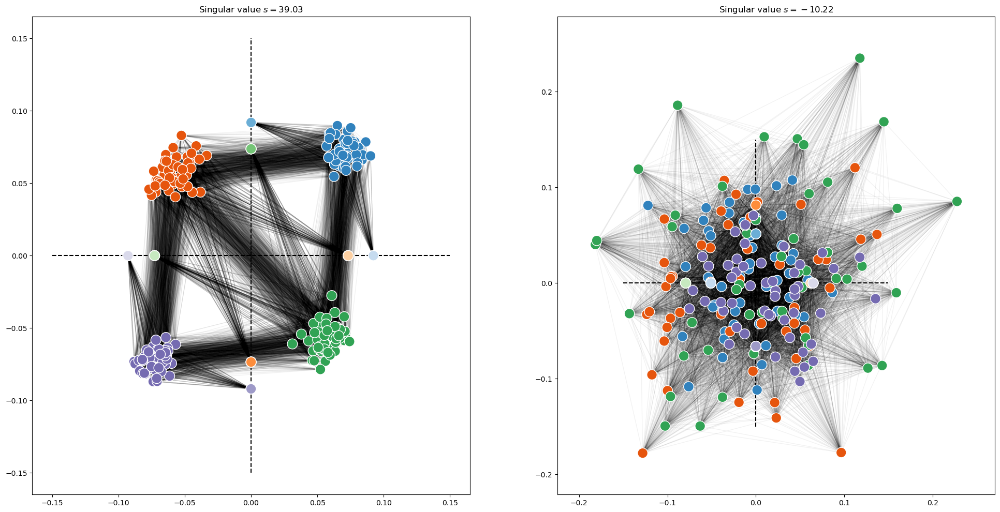

In [65]:
add_only = False

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph_added, null_model="outin"), fix_negative=True)

graph_added_only = graph_added.copy()
graph_added_only[:200][:, :200] = 0

G = nx.Graph(graph_added)
if add_only:
    G = nx.Graph(graph_added_only)

fig, axes = plt.subplots(ncols=2, figsize=(24, 12))

custom_eig_ids = [0, -2]
for ax_i, ax in enumerate(axes):
    pos = {i: (U[i, custom_eig_ids[ax_i]], Vh[custom_eig_ids[ax_i], i]) for i in range(graph_added.shape[0])}
    nx.draw_networkx_edges(G, pos=pos, alpha=.05, ax=ax)

    ax.scatter(U[:, custom_eig_ids[ax_i]], Vh[custom_eig_ids[ax_i]], s=200, edgecolors="w", lw=1, color=plt.get_cmap("tab20c", 20)(colors))

    ax.plot([0]*2, [-.15, .15], "k--", zorder=0)
    ax.plot([-.15, .15], [0]*2, "k--", zorder=0)

    ax.set_title(f"Singular value $s={S[custom_eig_ids[ax_i]]:2.2f}$")
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

#fig.savefig("./figures/toy_all-ideal"+add_only*"-added_only"+".png", dpi=300)

In [45]:
density_value = 0.5
con_prob = 0.6
#random_con = 1.8
random_con = 0.1
#added_density = 1
added_density = 5

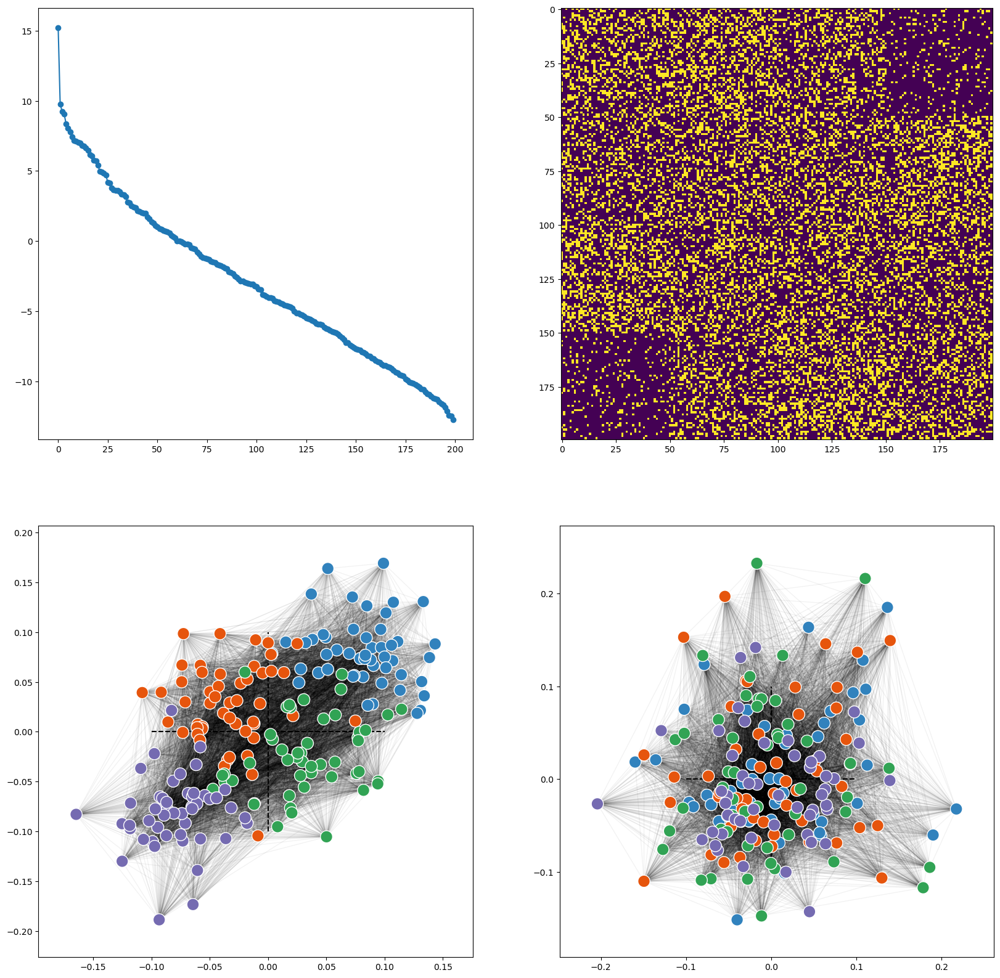

In [58]:
graph = dgsp_graphs.toy_n_communities(50, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[con_prob, 1-con_prob, 1-con_prob, .5, con_prob, 1-con_prob], seed=1234)

n_nodes = graph.shape[0]
n_per_com = n_nodes//4
graph_added = graph.copy()

add_all = False
n_added = 5
added_cols = np.zeros((graph_added.shape[0], 4*n_added))

for i in range(4):
    added_cols[50*i:50*(i+1), i*n_added:n_added*(i+1)] = 1

sparse_thresh = .01

sparse_threshes = np.linspace(-.2, -.1, n_added)
sparse_threshes = [added_density]*n_added

for source_id in range(4):
    for col_i, t in enumerate(sparse_threshes):
        random_sparse = np.random.normal(np.zeros(added_cols.shape[0]), 1)
        added_cols[random_sparse < t, n_added*source_id+col_i] = 0

graph_added = np.hstack([graph_added, added_cols])

added_rows = np.zeros((4*n_added, graph_added.shape[1]))
graph_added = np.vstack([graph_added, np.zeros((4*n_added, graph_added.shape[1]))])

for i in range(4):
    added_rows[i*n_added:n_added*(i+1), 50*i:50*(i+1)] = 1

for sink_id in range(4):
    for row_i, t in enumerate(sparse_threshes):
        random_sparse = np.random.normal(np.zeros(added_rows.shape[1]), 1)
        added_rows[n_added*sink_id+row_i, random_sparse < t] = 0

graph_added = np.vstack([graph_added, added_rows])
graph_added = np.hstack([graph_added, np.zeros((graph_added.shape[0], 4*n_added))])

# Adding densely connected nodes
if add_all:
    added_dense = (np.random.normal(0, 1, (graph_added.shape[0]+n_added, graph_added.shape[0]+n_added)) > 0).astype(int)
    #added_dense = np.ones((graph_added.shape[0]+n_added, graph_added.shape[0]+n_added))
    added_dense[:graph_added.shape[0]][:, :graph_added.shape[0]] = graph_added
    added_dense[n_nodes:][:, n_nodes:] = 0
    graph_added = added_dense

graph_added = graph.copy()

# Creating random connections
#graph_added += (np.random.normal(0, 1, graph_added.shape) > random_con).astype(int)
graph_added += dgsp_graphs.random_graph(graph_added.shape[0], random_con)

graph_added = np.clip(graph_added, a_min=0, a_max=1)

graph_added -= np.diag(np.diag(graph_added))

# Use cmap tab20c
colors = np.zeros(graph_added.shape[0], dtype=int)

for i in range(4):
    colors[n_per_com*i:n_per_com*(i+1)] = i*4
    colors[n_nodes+n_added*i:n_nodes+n_added*(i+1)] = i*4+1
    colors[n_nodes+n_added*4+n_added*i:n_nodes+n_added*4+n_added*(i+1)] = i*4+3

if add_all:
    colors[-n_added:] = 17

add_only = False

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph_added, null_model="outin"))

graph_added_only = graph_added.copy()
graph_added_only[:200][:, :200] = 0

G = nx.Graph(graph_added)
if add_only:
    G = nx.Graph(graph_added_only)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))

axes[0, 0].plot(S, "o-")
axes[0, 1].imshow(graph_added, interpolation="none")

for vect_id in [0, 1]:
    pos = {i: (U[i, vect_id], Vh[vect_id, i]) for i in range(graph_added.shape[0])}
    nx.draw_networkx_edges(G, pos=pos, alpha=.05, ax=axes[1, 0+vect_id])

    axes[1, 0+vect_id].scatter(U[:, vect_id], Vh[vect_id], s=200, edgecolors="w", lw=1, color=plt.get_cmap("tab20c", 20)(colors))

    axes[1, 0+vect_id].plot([0]*2, [-.1, .1], "k--", zorder=0)
    axes[1, 0+vect_id].plot([-.1, .1], [0]*2, "k--", zorder=0)

    axes[1, 0+vect_id].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

#fig.savefig(f"./figures/toy_all-RealCase-RandomNoise{random_con}.png", dpi=300)
#fig.savefig(f"./figures/toy_all-IdealColor-SinkSources.png", dpi=300)

## Removing communities

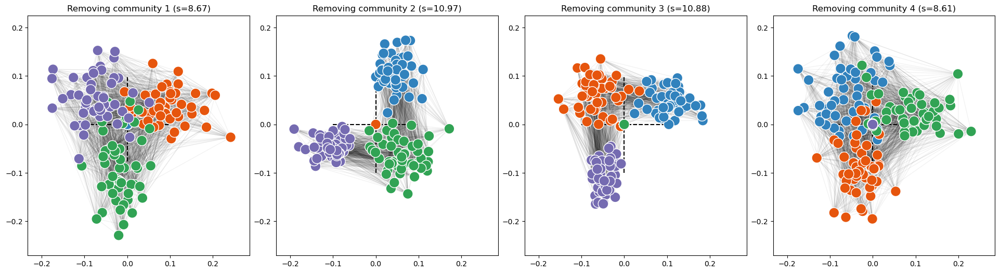

In [21]:
graph = dgsp_graphs.toy_n_communities(50, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, .5, 1, 0], seed=123)

# Use cmap tab20c
colors = np.zeros(graph.shape[0], dtype=int)

for i in range(4):
    colors[n_per_com*i:n_per_com*(i+1)] = i*4

fig, axes = plt.subplots(ncols=4, figsize=(24, 6), sharex=True, sharey=True, gridspec_kw={"wspace": 0.12})

for i, ax in enumerate(axes):
    graph_rem = graph.copy()
    graph_rem[50*i:50*(i+1)] = 0
    graph_rem[:, 50*i:50*(i+1)] = 0

    U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph_rem, null_model="outin"))

    G = nx.Graph(graph_rem)
    pos = {i: (U[i, 0], Vh[0, i]) for i in range(graph_rem.shape[0])}
    nx.draw_networkx_edges(G, pos=pos, alpha=.05, ax=ax)

    ax.scatter(U[:, 0], Vh[0], s=200, edgecolors="w", lw=1, color=plt.get_cmap("tab20c", 20)(colors))

    ax.plot([0]*2, [-.1, .1], "k--", zorder=0)
    ax.plot([-.1, .1], [0]*2, "k--", zorder=0)

    ax.set_title(f"Removing community {i+1} (s={S[0]:2.2f})")
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

#fig.savefig(f"./figures/toy_all-RealCase-RandomNoise{random_con}.png", dpi=300)
fig.savefig(f"./figures/toy-RemoveCom.png", dpi=600)

## Making communities only with Sinks and Sources

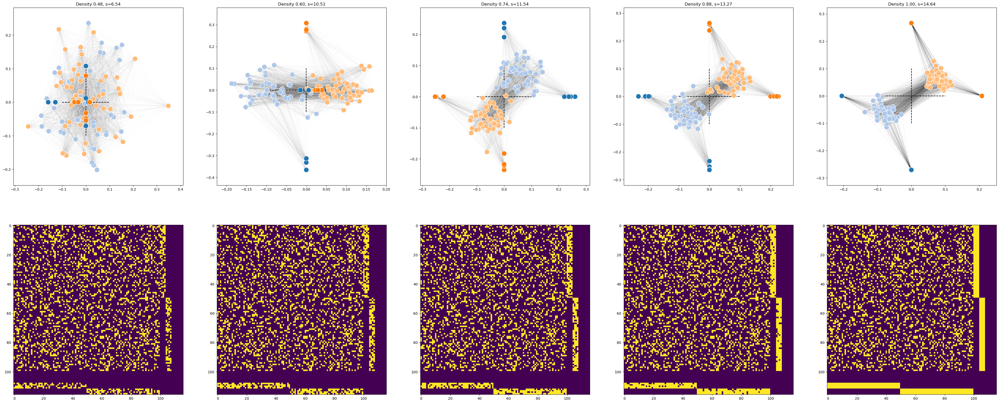

In [57]:
n_nodes = 100
edge_prob = 0.5
original_rand = dgsp_graphs.random_graph(n_nodes, edge_prob, True, 1234)

n_added = 4
n_coms = 2

threshes = np.linspace(-2.5, 0, 5)
threshes = np.linspace(0.5, 1, 5)

fig, axes = plt.subplots(nrows=2, ncols=len(threshes), figsize=(len(threshes)*10, 20))
for thresh, ax in zip(threshes, axes.T):

    added = []
    for i in range(n_coms):
        #rand_conn = (np.random.normal(0, 1, (n_nodes//n_coms, n_added)) > thresh).astype(int)
        rand_conn = dgsp_graphs.random_connector(n_nodes//n_coms, thresh, out_prob=1, seed=1234+i+int(10*thresh))[0, :, :n_added]
        filler = np.concatenate([rand_conn, np.zeros((n_nodes//n_coms, n_added))], axis=0)
        filler = np.roll(filler, i*n_nodes//n_coms, axis=0)

        added.append(filler)

    added_arr = np.hstack(added)
    added_arr = np.hstack([added_arr, np.zeros_like(added_arr)])

    my = np.block([[original_rand, added_arr], [np.roll(added_arr, n_added*n_coms, axis=1).T, np.zeros((2*n_coms*n_added, 2*n_coms*n_added))]])

    my -= np.diag(np.diag(my))

    colors = np.zeros(my.shape[0], dtype=int)

    colors[:n_nodes//2] = 1
    colors[n_nodes//2:] = 3

    for i, col in enumerate([0, 2, 0, 2]):
        colors[n_nodes+i*n_added:n_nodes+(i+1)*n_added] = col

    #colors[n_nodes:n_nodes+n_added] = 1
    #colors[n_nodes+n_added:n_nodes+2*n_added] = 1
    #colors[] = 2

    U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(my, null_model="outin"))

    G = nx.Graph(my)
    if add_only:
        G = nx.Graph(my)

    ax[1].imshow(my)

    pos = {i: (U[i, 0], Vh[0, i]) for i in range(my.shape[0])}
    nx.draw_networkx_edges(G, pos=pos, alpha=.02, ax=ax[0])

    ax[0].scatter(U[:, 0], Vh[0], s=200, edgecolors="w", lw=1, c=colors, cmap="tab20", vmax=20)

    ax[0].plot([0]*2, [-.1, .1], "k--", zorder=0)
    ax[0].plot([-.1, .1], [0]*2, "k--", zorder=0)

    ax[0].set_title(f"Density {np.sum(rand_conn)/(n_added*n_nodes//n_coms):.2f}, s={S[0]:2.2f}")
    ax[0].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

#fig.savefig("./figures/toy_all-com_from_sinksource.png", dpi=600)

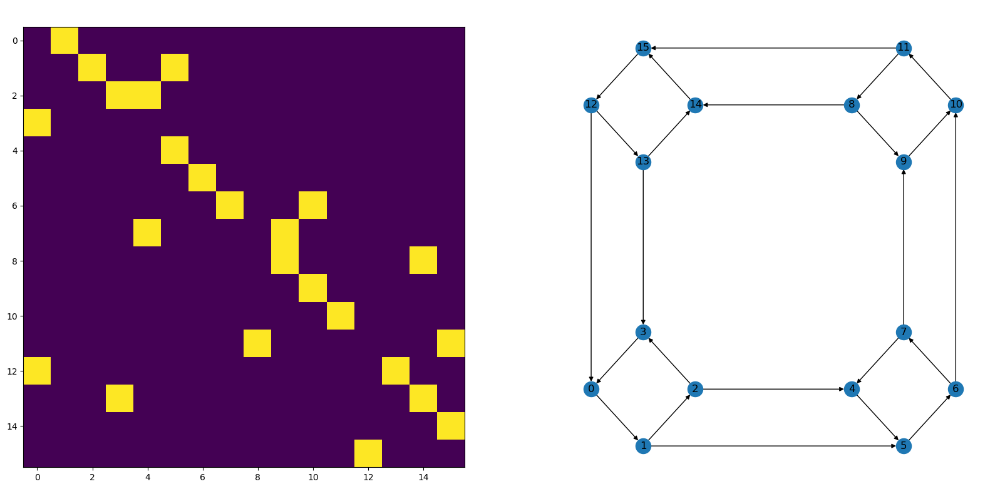

In [69]:
# Flow-based cluster

my_cycle = np.array([[0, 1, 0, 0],
                     [0, 0, 1, 0],
                     [0, 0, 0, 1],
                     [1, 0, 0, 0]])

my_block = np.block([[my_cycle, np.zeros_like(my_cycle), np.zeros_like(my_cycle), np.zeros_like(my_cycle)],
                     [np.zeros_like(my_cycle), my_cycle, np.zeros_like(my_cycle), np.zeros_like(my_cycle)],
                     [np.zeros_like(my_cycle), np.zeros_like(my_cycle), my_cycle, np.zeros_like(my_cycle)],
                     [np.zeros_like(my_cycle), np.zeros_like(my_cycle), np.zeros_like(my_cycle), my_cycle]])

my_block[[1, 6, 11, 12, 2, 7, 8, 13],
         [5, 10, 15, 0, 4, 9, 14, 3]] = 1

fig, axes = plt.subplots(ncols=2, figsize=(20, 10))

axes[0].imshow(my_block)

big_pos = np.array([[0, 0], [1, 0], [1, 1], [0, 1]])
small_pos = np.array([[-.2, 0], [0, -.2], [.2, 0], [0, .2]])

pos = {i: (big_pos[i//4, 0]+small_pos[i%4, 0], big_pos[i//4, 1]+small_pos[i%4, 1]) for i in range(16)}

G = nx.DiGraph(my_block)
nx.draw(G, pos=pos, with_labels=True, ax=axes[1])

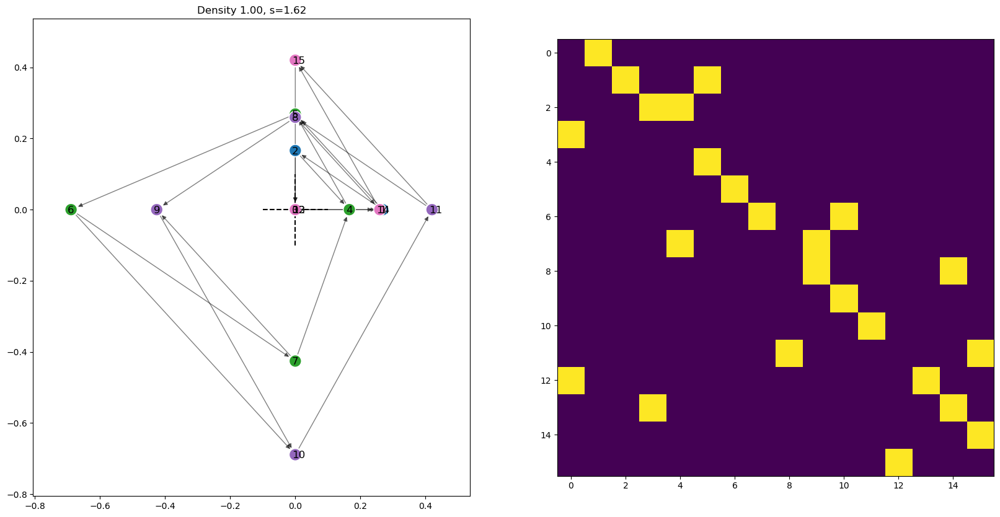

In [83]:
U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(my_block, null_model="outin"))

G = nx.DiGraph(my_block)

eig_id = 0

fig, ax = plt.subplots(ncols=2, figsize=(20, 10))
ax[1].imshow(my_block)
pos = {i: (U[i, eig_id], Vh[eig_id, i]) for i in range(my_block.shape[0])}

colors = np.zeros(my_block.shape[0], dtype=int)

for i in range(4):
    colors[4*i:4*(i+1)] = 4*i

nx.draw_networkx_edges(G, pos=pos, alpha=.5, ax=ax[0])

ax[0].scatter(U[:, eig_id], Vh[eig_id], s=200, edgecolors="w", lw=1, c=colors, cmap="tab20", vmax=20)
#ax[0].scatter(U[:, 0], Vh[0], s=200, edgecolors="w", lw=1)

for i in range(16):
    ax[0].text(U[i, eig_id]-.01, Vh[eig_id, i]-.01, f"{i}", fontsize=12)

ax[0].plot([0]*2, [-.1, .1], "k--", zorder=0)
ax[0].plot([-.1, .1], [0]*2, "k--", zorder=0)

ax[0].set_title(f"Density {np.sum(rand_conn)/(n_added*n_nodes//n_coms):.2f}, s={S[eig_id]:2.2f}")
ax[0].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)